# Tutorial 11: Batch effect correction

## set up

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import umap

import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

import pandas as pd
import numpy as np
import gc
import os
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
import matplotlib as mpl

mpl.rcParams["pdf.fonttype"] = 42
# plt.rcParams['savefig.dpi'] = 300 #图片像素
# plt.rcParams['figure.dpi'] = 300 #分辨率

/home/lisijie/anaconda3/envs/pyg_backup/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import random


def setup_seed(seed):
    """
    Set random seed.

    Parameters
    ----------
    seed
        Number to be set as random seed for reproducibility.

    """
    np.random.seed(seed)
    random.seed(seed)


setup_seed(2025)

In [5]:
def z_score_rows(x, center=True, scale=True, max_value=10):
    # Centering and scaling along rows
    if center:
        x = x - np.mean(x, axis=1, keepdims=True)
    if scale:
        x = x / np.std(x, axis=1, keepdims=True)
    if max_value is not None:
        x = np.clip(x, -max_value, max_value)
    return x

In [4]:
emb_AD_rep1 = sc.read(
    "/mnt/sdf/lisijie/Data/Results/spotformer/Plot/to_xilin_sijie/embedding/AD_mouse_rep1.h5ad"
)
emb_AD_rep1

AnnData object with n_obs × n_vars = 10366 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'p-tau', 'Aβ', 'ct_top', 'ct_sub'
    obsm: 'spatial'

In [6]:
emb_WT_rep1 = sc.read(
    "/mnt/sdf/lisijie/Data/Results/spotformer/Plot/to_xilin_sijie/embedding/WT_mouse_rep1.h5ad"
)
emb_WT_rep1

AnnData object with n_obs × n_vars = 8000 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'ct_top', 'ct_sub'
    obsm: 'spatial'

In [7]:
# 先合并，再预处理+umap
emb_WT_rep1.obs["batch"] = "emb_WT_rep1"
emb_AD_rep1.obs["batch"] = "emb_AD_rep1"

adata_combined_4 = sc.concat([emb_WT_rep1, emb_AD_rep1])
adata_combined_4

/home/lisijie/anaconda3/envs/pyg_backup/lib/python3.11/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 18366 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'ct_top', 'ct_sub', 'batch'
    obsm: 'spatial'

In [8]:
def preprocess_squidpy(adata_input, random_seed: int = 2025):
    """
    统一的预处理
    """
    # sc.pp.filter_genes(adata, min_cells=5)
    adata = adata_input.copy()

    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata, inplace=True, target_sum=10)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=300)
    adata.X = z_score_rows(adata.X)
    sc.pp.pca(adata, random_state=random_seed)
    sc.pp.neighbors(adata, random_state=random_seed)
    sc.tl.umap(adata, random_state=random_seed)

    return adata

In [9]:
adata_combined_4_pped = preprocess_squidpy(adata_combined_4, random_seed=2025)
adata_combined_4_pped

/home/lisijie/anaconda3/envs/pyg_backup/lib/python3.11/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 18366 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'ct_top', 'ct_sub', 'batch'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [10]:
import pathlib

# 1. 定义您的项目名称和输出路径
proj_name = "preprocess_1_SpotFormer_ADandWT_rep1"
# 注意：我修正了您变量名中的拼写错误 (porj_name -> proj_name)
output_path = (
    f"/mnt/sdf/lisijie/Data/Results/spotformer/Plot/to_xilin_sijie/figure/{proj_name}/"
)

# 2. 将字符串路径转换为一个 Path 对象
path_to_create = pathlib.Path(output_path)

# 3. 创建目录
#    parents=True: 如果父目录(./figure/)不存在，会自动创建它。
#    exist_ok=True: 如果目录已经存在，不会抛出错误。
path_to_create.mkdir(parents=True, exist_ok=True)

print(f"目录 '{path_to_create}' 已成功创建或已存在。")

目录 '/mnt/sdf/lisijie/Data/Results/spotformer/Plot/to_xilin_sijie/figure/preprocess_1_SpotFormer_ADandWT_rep1' 已成功创建或已存在。


In [11]:
adata_combined_4_pped.obs

,cell_id,center_x,center_y,n_spots,n_genes,cell_orig_id,cell_total_id,ct_top,ct_sub,batch
cell_1,1,12704.015873,26.730159,63,59,0,10803,Endo,Endo3,emb_WT_rep1
cell_3,3,18065.435484,39.612903,62,56,2,10805,SMC,S4,emb_WT_rep1
cell_4,4,8041.476744,47.441860,86,73,3,10806,Endo,Endo2,emb_WT_rep1
cell_5,5,16511.434783,62.584980,253,197,4,10807,CTX-Ex,CTX-Ex1,emb_WT_rep1
cell_6,6,18259.418919,51.337838,74,67,5,10808,SMC,S3,emb_WT_rep1
...,...,...,...,...,...,...,...,...,...,...
cell_10771,10771,5498.350394,22157.208661,254,196,10737,39996,Micro,Micro3,emb_AD_rep1
cell_10772,10772,10943.058824,22165.483193,238,190,10738,39997,CTX-Ex,CTX-Ex3,emb_AD_rep1
cell_10773,10773,14394.206897,22162.362069,58,53,10739,39998,CTX-Ex,CTX-Ex2,emb_AD_rep1
cell_10774,10774,12438.112219,22146.418953,401,282,10740,39999,CTX-Ex,CTX-Ex1,emb_AD_rep1


In [12]:
emb_AD_rep1.obs

,cell_id,center_x,center_y,n_spots,n_genes,cell_orig_id,cell_total_id,p-tau,Aβ,ct_top,ct_sub,batch
cell_3,3,3020.611465,19.433121,157,133,2,29261,0.0,0.0,DG,DG,emb_AD_rep1
cell_5,5,9696.577778,12.111111,45,41,4,29263,0.0,0.0,Oligo,Oligo1,emb_AD_rep1
cell_6,6,12907.233333,15.983333,60,54,5,29264,0.0,0.0,Oligo,Oligo1,emb_AD_rep1
cell_7,7,14157.250000,18.307692,52,46,6,29265,0.0,0.0,Oligo,Oligo1,emb_AD_rep1
cell_9,9,7893.649573,21.572650,117,90,8,29267,0.0,1.0,Astro,Astro3,emb_AD_rep1
...,...,...,...,...,...,...,...,...,...,...,...,...
cell_10771,10771,5498.350394,22157.208661,254,196,10737,39996,0.0,0.0,Micro,Micro3,emb_AD_rep1
cell_10772,10772,10943.058824,22165.483193,238,190,10738,39997,0.0,0.0,CTX-Ex,CTX-Ex3,emb_AD_rep1
cell_10773,10773,14394.206897,22162.362069,58,53,10739,39998,0.0,0.0,CTX-Ex,CTX-Ex2,emb_AD_rep1
cell_10774,10774,12438.112219,22146.418953,401,282,10740,39999,0.0,0.0,CTX-Ex,CTX-Ex1,emb_AD_rep1


In [13]:
emb_AD_rep1.obs["Aβ"].value_counts()

Aβ
0.0    10075
1.0      291
Name: count, dtype: int64

In [14]:
mapping_dict = {0.0: "None", 1.0: "Aβ"}

In [15]:
# 2. 使用 .map() 方法创建新列
# 它会查找 'Aβ' 列中的每一个值，然后在字典中找到对应的新值
emb_AD_rep1.obs["Aβ_cate"] = emb_AD_rep1.obs["Aβ"].map(mapping_dict)

In [16]:
emb_AD_rep1.obs

,cell_id,center_x,center_y,n_spots,n_genes,cell_orig_id,cell_total_id,p-tau,Aβ,ct_top,ct_sub,batch,Aβ_cate
cell_3,3,3020.611465,19.433121,157,133,2,29261,0.0,0.0,DG,DG,emb_AD_rep1,None
cell_5,5,9696.577778,12.111111,45,41,4,29263,0.0,0.0,Oligo,Oligo1,emb_AD_rep1,None
cell_6,6,12907.233333,15.983333,60,54,5,29264,0.0,0.0,Oligo,Oligo1,emb_AD_rep1,None
cell_7,7,14157.250000,18.307692,52,46,6,29265,0.0,0.0,Oligo,Oligo1,emb_AD_rep1,None
cell_9,9,7893.649573,21.572650,117,90,8,29267,0.0,1.0,Astro,Astro3,emb_AD_rep1,Aβ
...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_10771,10771,5498.350394,22157.208661,254,196,10737,39996,0.0,0.0,Micro,Micro3,emb_AD_rep1,None
cell_10772,10772,10943.058824,22165.483193,238,190,10738,39997,0.0,0.0,CTX-Ex,CTX-Ex3,emb_AD_rep1,None
cell_10773,10773,14394.206897,22162.362069,58,53,10739,39998,0.0,0.0,CTX-Ex,CTX-Ex2,emb_AD_rep1,None
cell_10774,10774,12438.112219,22146.418953,401,282,10740,39999,0.0,0.0,CTX-Ex,CTX-Ex1,emb_AD_rep1,None


In [17]:
# 3. 验证结果
print("转换前的 value_counts:")
print(emb_AD_rep1.obs["Aβ"].value_counts())

print("\n转换后的 value_counts:")
print(emb_AD_rep1.obs["Aβ_cate"].value_counts())

转换前的 value_counts:
Aβ
0.0    10075
1.0      291
Name: count, dtype: int64

转换后的 value_counts:
Aβ_cate
None    10075
Aβ        291
Name: count, dtype: int64


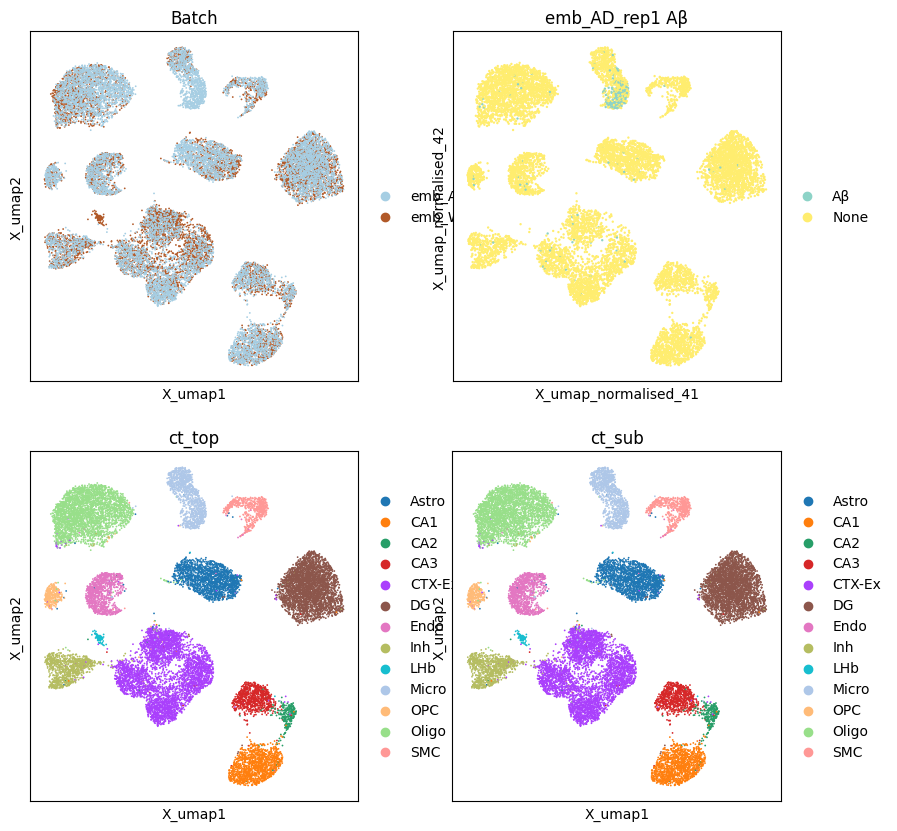

In [22]:
# 创建 2x2 子图
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

emb_AD_rep1.obsm["X_umap_normalised_4"] = (
    adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_AD_rep1"]
    .obsm["X_umap"]
    .copy()
)

# 第一行第二列
ax = axes[0, 1]
sc.pl.embedding(
    emb_AD_rep1,
    basis="X_umap_normalised_4",
    color="Aβ_cate",
    ax=ax,
    show=False,
    palette="Set3",
)
ax.set_title("emb_AD_rep1 Aβ")
ax.set_aspect("equal")

# 第一行第一列
ax = axes[0, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="batch",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
    palette="Paired",
)
ax.set_title(f"Batch")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 第二行第一列
ax = axes[1, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_top",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_top")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 第二行第二列
ax = axes[1, 1]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_top",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_sub")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 保存为高分辨率 PDF
fig.savefig(f"{output_path}/{proj_name}_abeta.pdf", dpi=300)
plt.show()

In [24]:
# 1. 确保你的顺序列表中包含了'batch'列中所有的唯一类别
#    这是一个好习惯，以防遗漏
all_categories = adata_combined_4_pped.obs["batch"].unique().tolist()
# desired_order = ...  # 在这里根据all_categories定义你的顺序
all_categories

['emb_WT_rep1', 'emb_AD_rep1']

In [45]:
# 创建一个颜色映射字典
# 键是你的 batch 名称，值是颜色
# 我们选择一个鲜艳的橙色和一个经典的蓝色
# 获取 'Set2' 调色板对象
set2_cmap = plt.get_cmap("Set3")

# 'Set2' 的颜色是以RGBA元组 (Red, Green, Blue, Alpha) 的形式存储的
# 我们可以直接通过索引获取
color_wt = set2_cmap(0)  # 第一个颜色
color_ad = set2_cmap(1)  # 第二个颜色

print(f"'Set2' 的第一个颜色 (RGBA): {color_wt}")
print(f"'Set2' 的第二个颜色 (RGBA): {color_ad}")

# 创建颜色映射字典
# Scanpy 的 palette 参数可以直接接收 RGBA 元组
color_map = {"emb_WT_rep1": color_wt, "emb_AD_rep1": color_ad}

# 1. 定义我们期望的绘图顺序
#    'emb_WT_rep1' 先画 (在底层)
#    'emb_AD_rep1' 后画 (在顶层)
plotting_order = ["emb_WT_rep1", "emb_AD_rep1"]

# 2. 创建一个新的、有序的 categorical 列 (或者覆盖旧的)
#    这是控制顺序的核心步骤
adata_combined_4_pped.obs["batch_ordered"] = pd.Categorical(
    values=adata_combined_4_pped.obs["batch"],  # 假设原始数据在 'batch' 列
    categories=plotting_order,
    ordered=True,
)

# 3. 验证一下 (可选，但推荐)
print(
    "新的有序类别:", adata_combined_4_pped.obs["batch_ordered"].cat.categories.tolist()
)
# 输出应该是: ['emb_WT_rep1', 'emb_AD_rep1']

'Set2' 的第一个颜色 (RGBA): (np.float64(0.5529411764705883), np.float64(0.8274509803921568), np.float64(0.7803921568627451), np.float64(1.0))
'Set2' 的第二个颜色 (RGBA): (np.float64(1.0), np.float64(1.0), np.float64(0.7019607843137254), np.float64(1.0))
新的有序类别: ['emb_WT_rep1', 'emb_AD_rep1']


In [46]:
adata_combined_4_pped.obs[["batch", "batch_ordered"]]

,batch,batch_ordered
cell_1,emb_WT_rep1,emb_WT_rep1
cell_3,emb_WT_rep1,emb_WT_rep1
cell_4,emb_WT_rep1,emb_WT_rep1
cell_5,emb_WT_rep1,emb_WT_rep1
cell_6,emb_WT_rep1,emb_WT_rep1
...,...,...
cell_10771,emb_AD_rep1,emb_AD_rep1
cell_10772,emb_AD_rep1,emb_AD_rep1
cell_10773,emb_AD_rep1,emb_AD_rep1
cell_10774,emb_AD_rep1,emb_AD_rep1


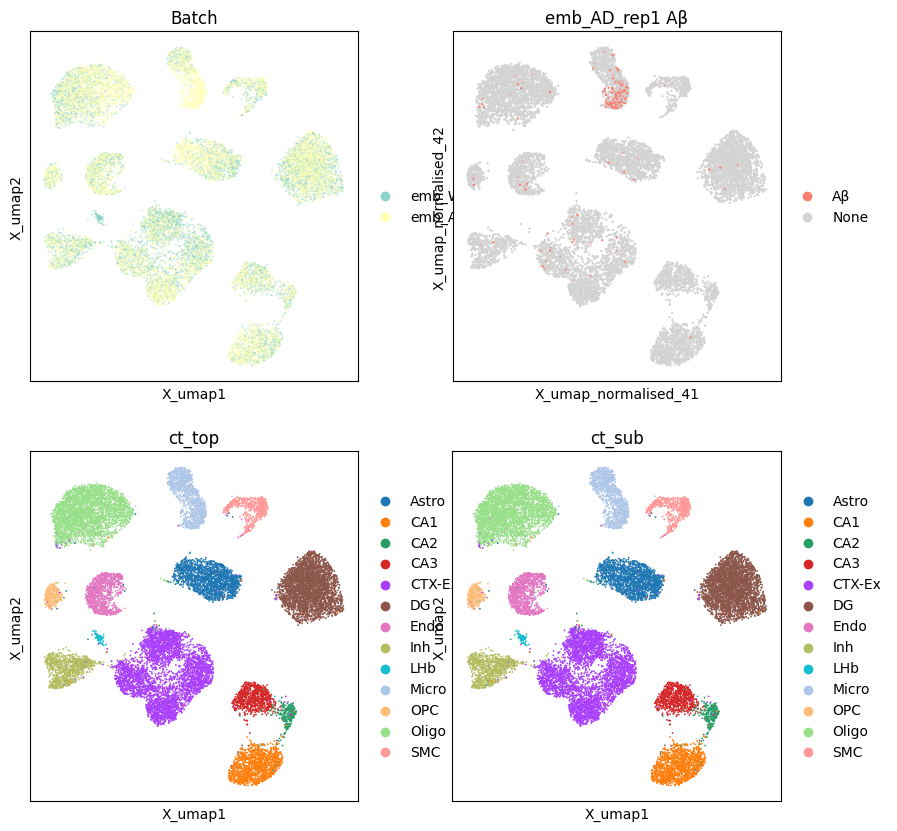

In [52]:
# 创建 2x2 子图
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

emb_AD_rep1.obsm["X_umap_normalised_4"] = (
    adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_AD_rep1"]
    .obsm["X_umap"]
    .copy()
)

# 颜色字典
color_map_abeta = {"Aβ": "salmon", "None": "lightgray"}  # 蓝色  # 橙色

# 第一行第二列
ax = axes[0, 1]
sc.pl.embedding(
    emb_AD_rep1,
    basis="X_umap_normalised_4",
    color="Aβ_cate",
    ax=ax,
    show=False,
    palette=color_map_abeta,
)
ax.set_title("emb_AD_rep1 Aβ")
ax.set_aspect("equal")

# 第一行第一列
ax = axes[0, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="batch_ordered",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
    palette=color_map,
    alpha=0.5,
)
ax.set_title(f"Batch")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 第二行第一列
ax = axes[1, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_top",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_top")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 第二行第二列
ax = axes[1, 1]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_sub",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_sub")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# 保存为高分辨率 PDF
fig.savefig(f"{output_path}/{proj_name}_abeta.pdf", dpi=300)
plt.show()

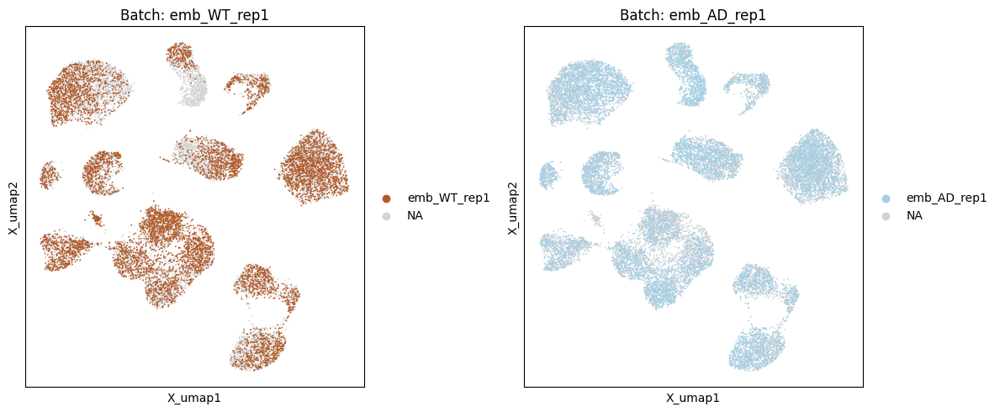

In [28]:
# 创建 2x2 子图
fig, axes = plt.subplots(1, 2, figsize=(12, 20))

batches = adata_combined_4_pped.obs["batch"].unique()
for ax, batch in zip(axes.flatten(), batches):
    sc.pl.embedding(
        adata_combined_4_pped,
        basis="X_umap",
        color="batch",  # 可以改成 "ct_sub" 或你需要的 group
        groups=batch,
        ax=ax,
        show=False,
    )
    ax.set_title(f"Batch: {batch}")
    ax.set_aspect("equal")  # 保持 x/y 比例一致

# 大标题
# plt.suptitle("UMAP embeddings by batch", fontsize=16)

# 调整布局
plt.tight_layout()

# 保存为高分辨率 PDF
fig.savefig(f"{output_path}/2.pdf", dpi=300)
plt.show()

In [70]:
import anndata

In [72]:
adata_combined_4_pped

AnnData object with n_obs × n_vars = 18366 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'ct_top', 'ct_sub', 'batch', 'batch_ordered'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'ct_top_colors', 'batch_ordered_colors', 'ct_sub_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [71]:
adata_concat = anndata.concat(
    [
        adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_AD_rep1"],
        adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_WT_rep1"],
    ]
)
adata_concat

/home/lisijie/anaconda3/envs/pyg_backup/lib/python3.11/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 18366 × 512
    obs: 'cell_id', 'center_x', 'center_y', 'n_spots', 'n_genes', 'cell_orig_id', 'cell_total_id', 'ct_top', 'ct_sub', 'batch', 'batch_ordered'
    obsm: 'spatial', 'X_pca', 'X_umap'
    layers: 'counts'

## visualization

'Set2' 的第一个颜色 (RGBA): (np.float64(1.0), np.float64(0.4980392156862745), np.float64(0.054901960784313725), np.float64(1.0))
'Set2' 的第二个颜色 (RGBA): (np.float64(0.12156862745098039), np.float64(0.4666666666666667), np.float64(0.7058823529411765), np.float64(1.0))
新的有序类别: ['emb_AD_rep1', 'emb_WT_rep1']


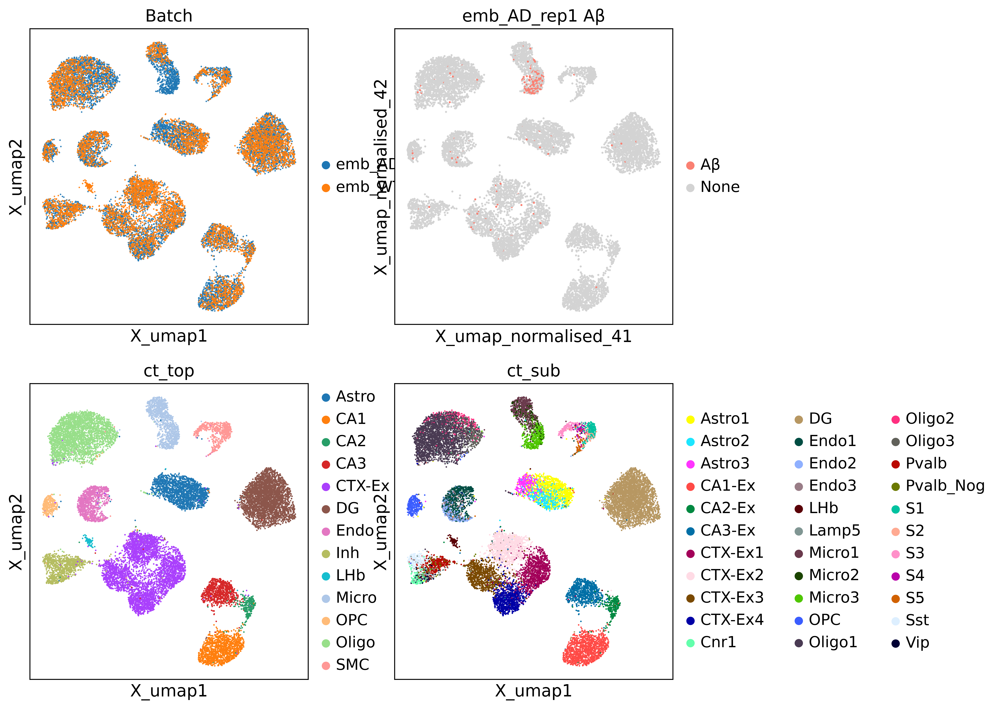

In [76]:
# 获取 'Set2' 调色板对象
set2_cmap = plt.get_cmap("tab10")

# 'Set2' 的颜色是以RGBA元组 (Red, Green, Blue, Alpha) 的形式存储的
# 我们可以直接通过索引获取
color_wt = set2_cmap(1)  # 第一个颜色
color_ad = set2_cmap(0)  # 第二个颜色

print(f"'Set2' 的第一个颜色 (RGBA): {color_wt}")
print(f"'Set2' 的第二个颜色 (RGBA): {color_ad}")

# 创建颜色映射字典
# Scanpy 的 palette 参数可以直接接收 RGBA 元组
color_map = {"emb_WT_rep1": color_wt, "emb_AD_rep1": color_ad}
# 1. 定义我们期望的绘图顺序
#    'emb_WT_rep1' 先画 (在底层)
#    'emb_AD_rep1' 后画 (在顶层)
plotting_order = ["emb_AD_rep1", "emb_WT_rep1"]

# 2. 创建一个新的、有序的 categorical 列 (或者覆盖旧的)
#    这是控制顺序的核心步骤
adata_combined_4_pped.obs["batch_ordered"] = pd.Categorical(
    values=adata_combined_4_pped.obs["batch"],  # 假设原始数据在 'batch' 列
    categories=plotting_order,
    ordered=True,
)

# 3. 验证一下 (可选，但推荐)
print(
    "新的有序类别:", adata_combined_4_pped.obs["batch_ordered"].cat.categories.tolist()
)
# 输出应该是: ['emb_WT_rep1', 'emb_AD_rep1']

# 创建 2x2 子图
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

emb_AD_rep1.obsm["X_umap_normalised_4"] = (
    adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_AD_rep1"]
    .obsm["X_umap"]
    .copy()
)

# 颜色字典
color_map_abeta = {"Aβ": "salmon", "None": "lightgray"}  # 蓝色  # 橙色

# 第一行第二列
ax = axes[0, 1]
sc.pl.embedding(
    emb_AD_rep1,
    basis="X_umap_normalised_4",
    color="Aβ_cate",
    ax=ax,
    show=False,
    palette=color_map_abeta,
)
ax.set_title("emb_AD_rep1 Aβ")
ax.set_aspect("equal")

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第一行第一列
ax = axes[0, 0]
sc.pl.embedding(
    adata_concat,
    basis="X_umap",
    color="batch_ordered",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
    palette=color_map,
    alpha=0.9,
)
ax.set_title(f"Batch")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第二行第一列
ax = axes[1, 0]
sc.pl.embedding(
    adata_concat,
    basis="X_umap",
    color="ct_top",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_top")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第二行第二列
ax = axes[1, 1]
sc.pl.embedding(
    adata_concat,
    basis="X_umap",
    color="ct_sub",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_sub")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 保存为高分辨率 PDF
fig.savefig(f"{output_path}/{proj_name}_abeta2.pdf", dpi=300)
plt.show()

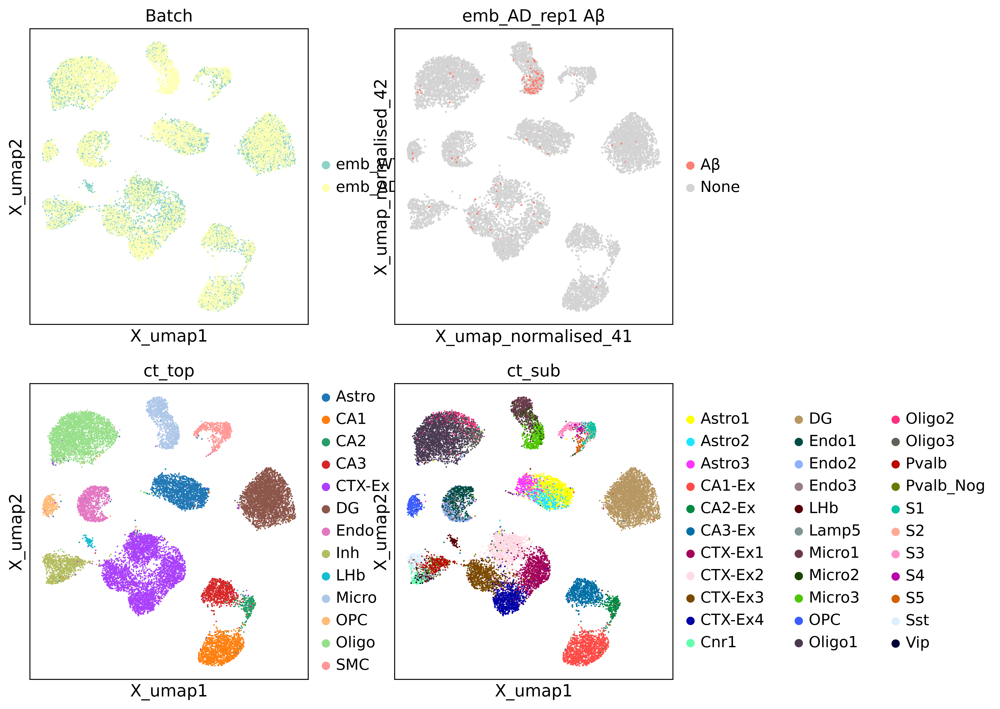

In [59]:
# 创建 2x2 子图
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

emb_AD_rep1.obsm["X_umap_normalised_4"] = (
    adata_combined_4_pped[adata_combined_4_pped.obs["batch"] == "emb_AD_rep1"]
    .obsm["X_umap"]
    .copy()
)

# 颜色字典
color_map_abeta = {"Aβ": "salmon", "None": "lightgray"}  # 蓝色  # 橙色

# 第一行第二列
ax = axes[0, 1]
sc.pl.embedding(
    emb_AD_rep1,
    basis="X_umap_normalised_4",
    color="Aβ_cate",
    ax=ax,
    show=False,
    palette=color_map_abeta,
)
ax.set_title("emb_AD_rep1 Aβ")
ax.set_aspect("equal")

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第一行第一列
ax = axes[0, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="batch_ordered",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
    palette=color_map,
    alpha=0.9,
)
ax.set_title(f"Batch")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第二行第一列
ax = axes[1, 0]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_top",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_top")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 第二行第二列
ax = axes[1, 1]
sc.pl.embedding(
    adata_combined_4_pped,
    basis="X_umap",
    color="ct_sub",  # 可以改成 "ct_sub" 或你需要的 group
    ax=ax,
    show=False,
)
ax.set_title(f"ct_sub")
ax.set_aspect("equal")  # 保持 x/y 比例一致

# --- 关键：只栅格化散点，不栅格化文字/图例 ---
for coll in ax.collections:
    coll.set_rasterized(True)


# 保存为高分辨率 PDF
fig.savefig(f"{output_path}/{proj_name}_abeta2.pdf", dpi=300)
plt.show()